In [1]:
!pip install --upgrade --force-reinstall numpy==1.26.4 scipy==1.13.1 pandapower==2.14.6

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 9.4 MB/s eta 0:00:0000:0100:01m
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.2/91.2 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 108.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 55.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 78.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 112.4 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.4/91.4 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78

In [2]:

import numpy as np
import pandas as pd
from scipy.stats import entropy
import pandapower as pp, pickle
net = pp.networks.case118()

In [3]:
with open("pandapower_net.pkl", "wb") as f:
    pickle.dump(net, f)
print("Saved pandapower_net.pkl")

Saved pandapower_net.pkl


In [25]:
import os, math, pickle
import numpy as np
import pandas as pd
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim

DATA_CSV = "/kaggle/input/dataset118/actual_data_118 (1).csv"
YBUS_NPZ = "Ybus.npz"
PANDAPOWER_NET_PKL = "pandapower_net.pkl"
OUT_CSV = "ddim_stochastic_constrained_generated.csv"

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
NUM_BUS = 118
NUM_FEATURES = 4 * NUM_BUS
BATCH_SIZE = 64
EPOCHS = 1000
LR = 1e-4
TIMESTEPS = 1000
DDIM_STEPS = 300
ETA = 0.2
SAMPLE_COUNT = 5000
GUIDANCE_LAMBDA = 1e-4

if not os.path.exists(DATA_CSV):
    raise FileNotFoundError("Need actual_data.csv generated from PF dataset code.")
df = pd.read_csv(DATA_CSV)
cols = df.columns.tolist()
if df.shape[1] != NUM_FEATURES:
    raise ValueError(f"Dataset must have {NUM_FEATURES} columns.")
data = df.values.astype(np.float32)

def load_ybus():
    if os.path.exists(YBUS_NPZ):
        arr = np.load(YBUS_NPZ)
        return arr["G"].astype(np.float64), arr["B"].astype(np.float64)
    if os.path.exists(PANDAPOWER_NET_PKL):
        import pandapower as pp
        with open(PANDAPOWER_NET_PKL, "rb") as f:
            net = pickle.load(f)
        nb = len(net.bus)
        Y = np.zeros((nb, nb), dtype=complex)
        for _, row in net.line.iterrows():
            i, j = int(row["from_bus"]), int(row["to_bus"])
            r, x = row["r_ohm_per_km"], row["x_ohm_per_km"]
            length = row.get("length_km", 1.0)
            y = 1 / complex(r * length, x * length)
            Y[i, i] += y; Y[j, j] += y; Y[i, j] -= y; Y[j, i] -= y
        return np.real(Y), np.imag(Y)
    raise FileNotFoundError("Need Ybus.npz or pandapower_net.pkl for guidance.")

G_np, B_np = load_ybus()
G = torch.tensor(G_np, dtype=torch.float32, device=DEVICE)
B = torch.tensor(B_np, dtype=torch.float32, device=DEVICE)

xmin, xmax = data.min(axis=0), data.max(axis=0)
range_eps = (xmax - xmin).copy()
range_eps[range_eps == 0] = 1e-6

def normalize(x):  
    return 2 * (x - xmin) / range_eps - 1

def denormalize(xn):  
    return ((xn + 1) / 2) * range_eps + xmin

data_tensor = torch.tensor(normalize(data), dtype=torch.float32, device=DEVICE)

p_min = torch.tensor(xmin[:NUM_BUS], device=DEVICE, dtype=torch.float32)
p_max = torch.tensor(xmax[:NUM_BUS], device=DEVICE, dtype=torch.float32)
q_min = torch.tensor(xmin[NUM_BUS:2*NUM_BUS], device=DEVICE, dtype=torch.float32)
q_max = torch.tensor(xmax[NUM_BUS:2*NUM_BUS], device=DEVICE, dtype=torch.float32)
v_min = torch.tensor(xmin[2*NUM_BUS:3*NUM_BUS], device=DEVICE, dtype=torch.float32)
v_max = torch.tensor(xmax[2*NUM_BUS:3*NUM_BUS], device=DEVICE, dtype=torch.float32)

# ---------- Helpers ----------
def split_vec(x):
    p, q, v, th = x[:, :NUM_BUS], x[:, NUM_BUS:2*NUM_BUS], \
                  x[:, 2*NUM_BUS:3*NUM_BUS], x[:, 3*NUM_BUS:4*NUM_BUS]
    return torch.cat([p, th], 1), torch.cat([q, v], 1)

def concat_vec(x1, x2):
    p, th = x1[:, :NUM_BUS], x1[:, NUM_BUS:]
    q, v  = x2[:, :NUM_BUS], x2[:, NUM_BUS:]
    return torch.cat([p, q, v, th], 1)

def linear_beta_schedule(T, start=1e-4, end=0.02):
    return torch.linspace(start, end, T, device=DEVICE)

betas = linear_beta_schedule(TIMESTEPS)
alphas = 1 - betas
alphas_cumprod = torch.cumprod(alphas, 0)

class MLPDenoiser(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim + 1, 4096), nn.LayerNorm(4096), nn.SiLU(),
            nn.Linear(4096, 4096), nn.LayerNorm(4096), nn.SiLU(),
            nn.Linear(4096, 4096), nn.LayerNorm(4096), nn.SiLU(),
            nn.Linear(4096, dim)
        )

    def forward(self, x, t):
        t = t.float().unsqueeze(1) / TIMESTEPS  
        return self.net(torch.cat([x, t], 1))

model_dim = 4 * NUM_BUS
model = MLPDenoiser(model_dim).to(DEVICE)
opt = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-3, betas=(0.9, 0.999))
mse = nn.MSELoss()

train_data, val_data = train_test_split(data_tensor, test_size=0.1, random_state=42)
Ntrain, Nval = train_data.shape[0], val_data.shape[0]

print("Training denoiser with validation monitoring...")
best_val = float("inf")

for ep in range(EPOCHS):
    model.train()
    perm = torch.randperm(Ntrain, device=DEVICE)
    tot_loss = 0.0

    for i in range(0, Ntrain, BATCH_SIZE):
        b = train_data[perm[i:i+BATCH_SIZE]] 
        x = b
        Bc = x.size(0)
        if Bc == 0:
            continue

        t = torch.randint(0, TIMESTEPS, (Bc,), device=DEVICE)

        eps = torch.randn_like(x)

        sA = torch.sqrt(alphas_cumprod[t]).unsqueeze(1)
        sO = torch.sqrt(1 - alphas_cumprod[t]).unsqueeze(1)

        x_t = sA * x + sO * eps

        pred = model(x_t, t)

        loss = mse(pred, eps)

        opt.zero_grad()
        loss.backward()
        opt.step()

        tot_loss += loss.item() * Bc

    train_loss = tot_loss / Ntrain

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for i in range(0, Nval, BATCH_SIZE):
            b = val_data[i:i+BATCH_SIZE]
            x = b
            Bc = x.size(0)
            if Bc == 0:
                continue
            t = torch.randint(0, TIMESTEPS, (Bc,), device=DEVICE)
            eps = torch.randn_like(x)
            sA = torch.sqrt(alphas_cumprod[t]).unsqueeze(1)
            sO = torch.sqrt(1 - alphas_cumprod[t]).unsqueeze(1)
            x_t = sA * x + sO * eps
            pred = model(x_t, t)
            val_loss += mse(pred, eps).item() * Bc
    val_loss /= Nval

    print(f"Epoch {ep+1:4d}/{EPOCHS} | Train Loss: {train_loss:.6f} | Val Loss: {val_loss:.6f}")

    if val_loss < best_val:
        best_val = val_loss
        torch.save({
            "model": model.state_dict(),
            "opt": opt.state_dict(),
            "epoch": ep,
            "val_loss": val_loss
        }, "best_ddim_denoiser.pth")
        print(f"  New best model saved (val_loss={val_loss:.6f})")

print("Training done.\n")

Training denoiser with validation monitoring...
Epoch    1/1000 | Train Loss: 0.573268 | Val Loss: 0.330039
  New best model saved (val_loss=0.330039)
Epoch    2/1000 | Train Loss: 0.264251 | Val Loss: 0.229659
  New best model saved (val_loss=0.229659)
Epoch    3/1000 | Train Loss: 0.215689 | Val Loss: 0.213094
  New best model saved (val_loss=0.213094)
Epoch    4/1000 | Train Loss: 0.199903 | Val Loss: 0.184829
  New best model saved (val_loss=0.184829)
Epoch    5/1000 | Train Loss: 0.184388 | Val Loss: 0.183254
  New best model saved (val_loss=0.183254)
Epoch    6/1000 | Train Loss: 0.176368 | Val Loss: 0.178223
  New best model saved (val_loss=0.178223)
Epoch    7/1000 | Train Loss: 0.163664 | Val Loss: 0.165788
  New best model saved (val_loss=0.165788)
Epoch    8/1000 | Train Loss: 0.158718 | Val Loss: 0.157602
  New best model saved (val_loss=0.157602)
Epoch    9/1000 | Train Loss: 0.156231 | Val Loss: 0.142343
  New best model saved (val_loss=0.142343)
Epoch   10/1000 | Train L

In [ ]:
SAMPLE_COUNT = 10000
p_min_np = xmin[:NUM_BUS]
p_max_np = xmax[:NUM_BUS]
q_min_np = xmin[NUM_BUS:2 * NUM_BUS]
q_max_np = xmax[NUM_BUS:2 * NUM_BUS]
v_min_np = xmin[2 * NUM_BUS:3 * NUM_BUS]
v_max_np = xmax[2 * NUM_BUS:3 * NUM_BUS]

p_min = torch.tensor(p_min_np, device=DEVICE, dtype=torch.float32)  # (B,)
p_max = torch.tensor(p_max_np, device=DEVICE, dtype=torch.float32)
q_min = torch.tensor(q_min_np, device=DEVICE, dtype=torch.float32)
q_max = torch.tensor(q_max_np, device=DEVICE, dtype=torch.float32)
v_min = torch.tensor(v_min_np, device=DEVICE, dtype=torch.float32)
v_max = torch.tensor(v_max_np, device=DEVICE, dtype=torch.float32)

def power_residuals(x_den):
    p = x_den[:, :NUM_BUS]
    q = x_den[:, NUM_BUS:2 * NUM_BUS]
    v = x_den[:, 2 * NUM_BUS:3 * NUM_BUS]
    th = x_den[:, 3 * NUM_BUS:4 * NUM_BUS]

    th_r = th * math.pi / 180

    vb = v.unsqueeze(-1)
    vj = v.unsqueeze(-2) 
    dth = th_r.unsqueeze(-1) - th_r.unsqueeze(-2)

    cosd = torch.cos(dth)
    sind = torch.sin(dth)

    G_b = G.unsqueeze(0)
    B_b = B.unsqueeze(0)

    P = (vb * vj * (G_b * cosd + B_b * sind)).sum(dim=-1) 
    Q = (vb * vj * (G_b * sind - B_b * cosd)).sum(dim=-1) 

    return torch.cat([p - P, q - Q], dim=1)


def RH_sq(x_den):
    return (power_residuals(x_den) ** 2).sum(dim=1)


def RG_sq(x_den: torch.Tensor) -> torch.Tensor:
    p = x_den[:, :NUM_BUS]
    q = x_den[:, NUM_BUS:2 * NUM_BUS]
    v = x_den[:, 2 * NUM_BUS:3 * NUM_BUS]

    viol_p_upper = torch.relu(p - p_max)
    viol_p_lower = torch.relu(p_min - p)
    viol_q_upper = torch.relu(q - q_max)
    viol_q_lower = torch.relu(q_min - q)
    viol_v_upper = torch.relu(v - v_max)
    viol_v_lower = torch.relu(v_min - v)

    viol = torch.cat(
        [
            viol_p_upper, viol_p_lower,
            viol_q_upper, viol_q_lower,
            viol_v_upper, viol_v_lower,
        ],
        dim=1,
    )

    return (viol ** 2).sum(dim=1) 

def make_ddim_timesteps(ddim_steps):
    step = TIMESTEPS // ddim_steps
    return torch.arange(TIMESTEPS - 1, -1, -step, device=DEVICE, dtype=torch.long)


print("Sampling using stochastic DDIM with physics guidance...")

n_samples = SAMPLE_COUNT
x_t = torch.randn(n_samples, NUM_FEATURES, device=DEVICE)
re = torch.tensor(range_eps, device=DEVICE, dtype=torch.float32)
xm = torch.tensor(xmin, device=DEVICE, dtype=torch.float32)
timesteps = make_ddim_timesteps(DDIM_STEPS)

for step_idx, t_idx in enumerate(tqdm(timesteps.tolist(), desc="Stochastic DDIM Sampling")):
    t = torch.full((n_samples,), t_idx, device=DEVICE, dtype=torch.long)

    with torch.no_grad():
        eps_pred = model(x_t, t)  
        sA = torch.sqrt(alphas_cumprod[t]).unsqueeze(1)
        sO = torch.sqrt(1 - alphas_cumprod[t]).unsqueeze(1)
        x0 = (x_t - sO * eps_pred) / sA  

    x_den = ((x0 + 1.0) / 2.0) * re + xm
    x_den = x_den.detach().clone().requires_grad_(True)

    R_total = RH_sq(x_den) + RG_sq(x_den)

    g_phys = grad(R_total.sum(), x_den, retain_graph=False, create_graph=False)[0]
    grad_norm = g_phys * (re / 2.0)

    lam_t = GUIDANCE_LAMBDA * ((t.float() + 1.0) / TIMESTEPS).unsqueeze(1)

    x0_guided = x0 - lam_t * grad_norm
    x0_guided = torch.clamp(x0_guided, -1.0, 1.0)

    a_bar_t = alphas_cumprod[t].unsqueeze(1)

    if step_idx < len(timesteps) - 1:
        t_prev_idx = timesteps[step_idx + 1].item()
        t_prev = torch.full((n_samples,), t_prev_idx, device=DEVICE, dtype=torch.long)
        a_bar_prev = alphas_cumprod[t_prev].unsqueeze(1)
    else:
        a_bar_prev = torch.ones_like(a_bar_t)
        t_prev_idx = -1

    if t_prev_idx == -1:
        x_t = x0_guided.detach()
        continue

    denom = (1.0 - a_bar_t).clamp(min=1e-8)
    eps_pred = (x_t - torch.sqrt(a_bar_t) * x0_guided) / torch.sqrt(denom)

    frac = ((1.0 - a_bar_prev) / denom).clamp(min=0.0)
    inner = (1.0 - (a_bar_t / a_bar_prev)).clamp(min=0.0)
    sigma = ETA * torch.sqrt(frac * inner)

    sigma2 = sigma * sigma
    sqrt_term = (1.0 - a_bar_prev - sigma2).clamp(min=0.0)
    sqrt_term = torch.sqrt(sqrt_term)

    x_prev_mean = torch.sqrt(a_bar_prev) * x0_guided + sqrt_term * eps_pred
    z = torch.randn_like(x_t)
    x_t = x_prev_mean + sigma * z
    x_t = x_t.detach()
    
gen_norm = x_t.cpu().numpy()
gen_denorm = denormalize(gen_norm)

bad = ~np.isfinite(gen_denorm)
if bad.any():
    print(f"[warn] {bad.sum()} invalid values detected; replacing with finite values.")
    gen_denorm = np.nan_to_num(
        gen_denorm,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

OUT_CSV = f"ddim_stochastic_constrained_generated_{ETA}.csv"

pd.DataFrame(gen_denorm, columns=cols).to_csv(
    OUT_CSV,
    index=False
)

print(f"\nGenerated {len(gen_denorm)} stochastic-DDIM guided samples → {OUT_CSV}")



In [37]:
import pandas as pd
actual = pd.read_csv("/kaggle/input/test-data/test_data_118.csv")
generated = pd.read_csv("ddim_stochastic_constrained_generated_0.2.csv")

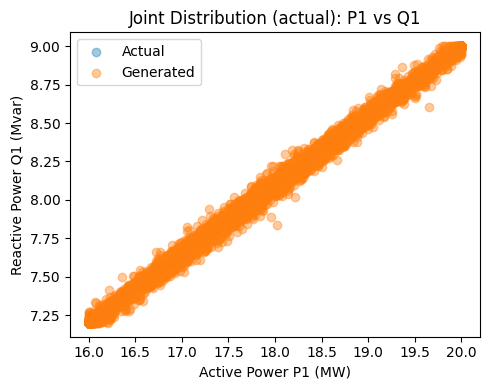

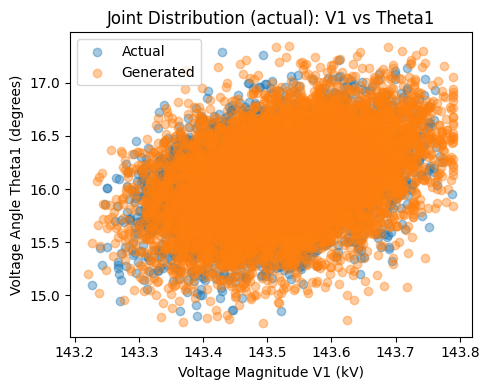

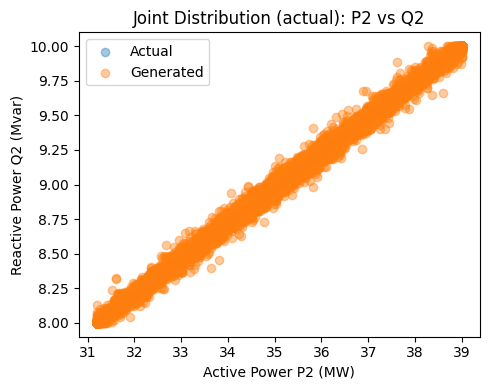

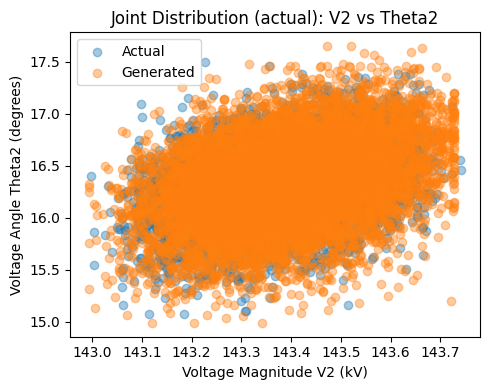

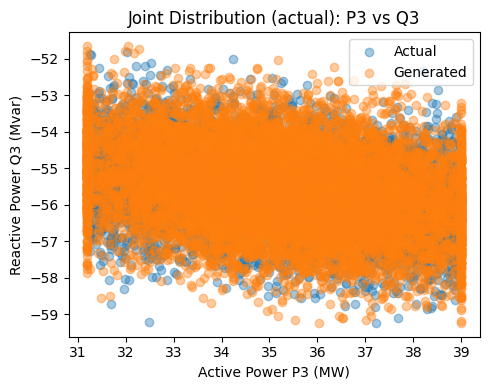

...

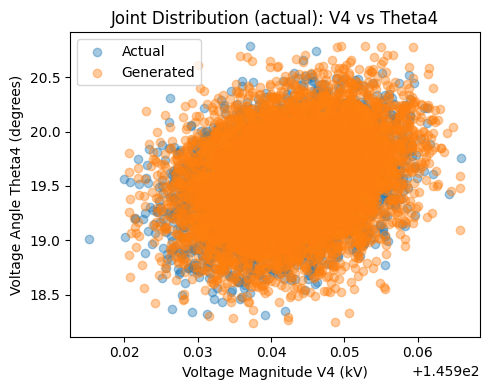

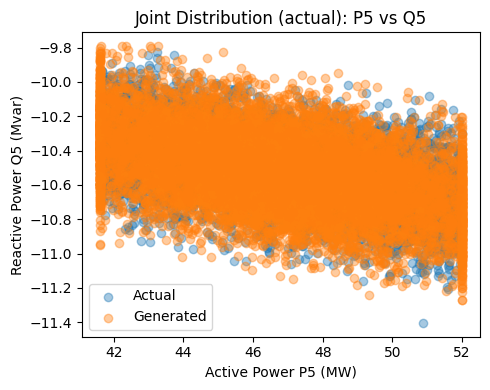

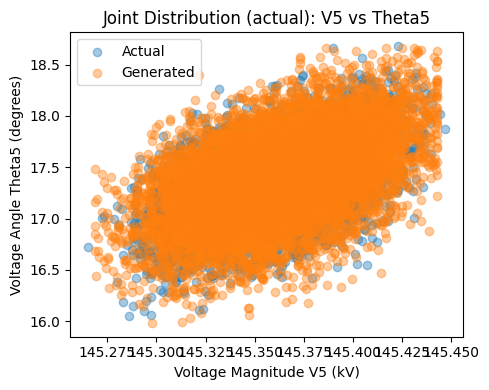

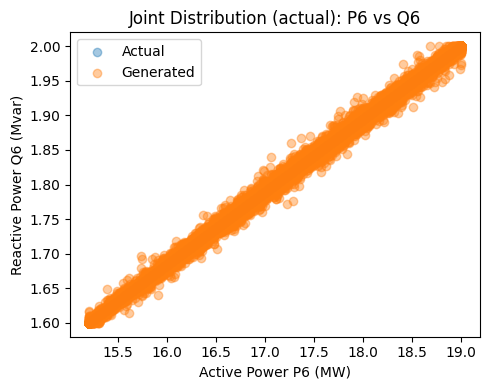

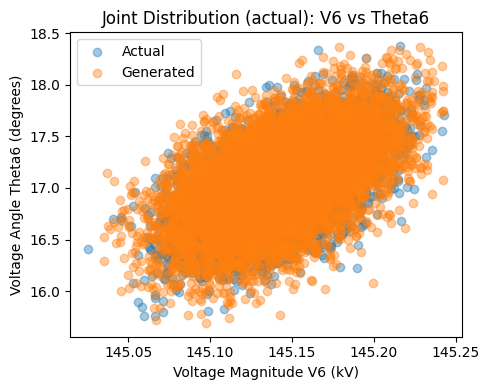

In [38]:
import matplotlib.pyplot as plt

actual_nonpu = actual.copy()
generated_nonpu = generated.copy()

BASE_MVA = 100
num_buses = 6

p_cols = [c for c in actual.columns if c.startswith("P")]
q_cols = [c for c in actual.columns if c.startswith("Q")]
v_cols = [c for c in actual.columns if c.startswith("V")]
theta_cols = [c for c in actual.columns if c.startswith("Theta")]

for col in p_cols:
    actual_nonpu[col] = actual[col] * BASE_MVA
    generated_nonpu[col] = generated[col] * BASE_MVA

for col in q_cols:
    actual_nonpu[col] = actual[col] * BASE_MVA
    generated_nonpu[col] = generated[col] * BASE_MVA

vn_kv = net.bus.vn_kv.values 
for i, col in enumerate(v_cols):
    actual_nonpu[col] = actual[col] * vn_kv[i]
    generated_nonpu[col] = generated[col] * vn_kv[i]

for i in range(1, num_buses + 1):
    p_col = f"P{i}"
    q_col = f"Q{i}"
    v_col = f"V{i}"
    th_col = f"Theta{i}"

    if all(c in actual_nonpu.columns for c in [p_col, q_col]):
        plt.figure(figsize=(5,4))
        plt.scatter(actual_nonpu[p_col], actual_nonpu[q_col], alpha=0.4, label="Actual")
        plt.scatter(generated_nonpu[p_col], generated_nonpu[q_col], alpha=0.4, label="Generated")
        plt.xlabel(f"Active Power {p_col} (MW)")
        plt.ylabel(f"Reactive Power {q_col} (Mvar)")
        plt.title(f"Joint Distribution (actual): {p_col} vs {q_col}")
        plt.legend()
        plt.tight_layout()
        plt.show()

    if all(c in actual_nonpu.columns for c in [v_col, th_col]):
        plt.figure(figsize=(5,4))
        plt.scatter(actual_nonpu[v_col], actual_nonpu[th_col], alpha=0.4, label="Actual")
        plt.scatter(generated_nonpu[v_col], generated_nonpu[th_col], alpha=0.4, label="Generated")
        plt.xlabel(f"Voltage Magnitude {v_col} (kV)")
        plt.ylabel(f"Voltage Angle {th_col} (degrees)")
        plt.title(f"Joint Distribution (actual): {v_col} vs {th_col}")
        plt.legend()
        plt.tight_layout()
        plt.show()



Detected 118 buses based on column naming (P1...P118).

Converted per-unit values to actual units (MW / Mvar / kV / degrees)


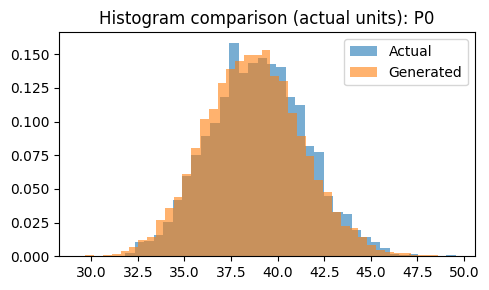

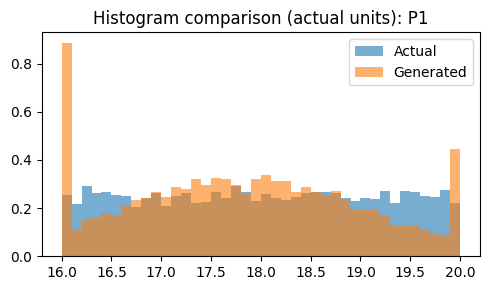

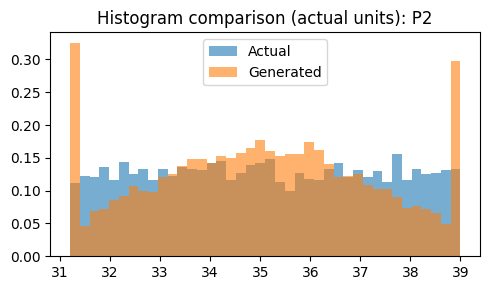

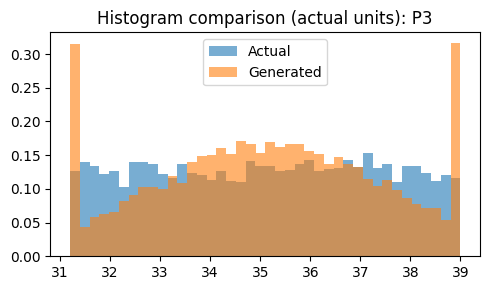

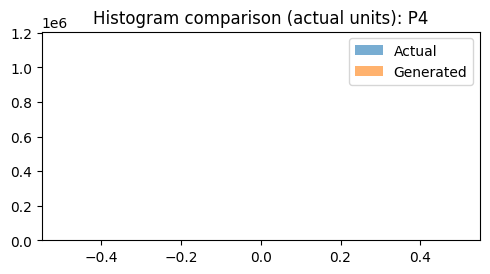

...

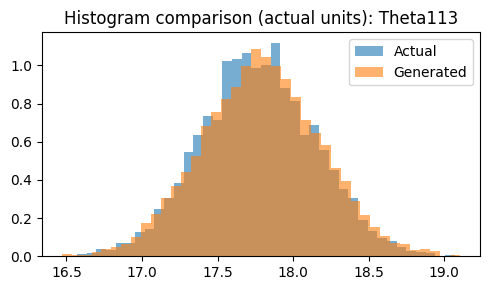

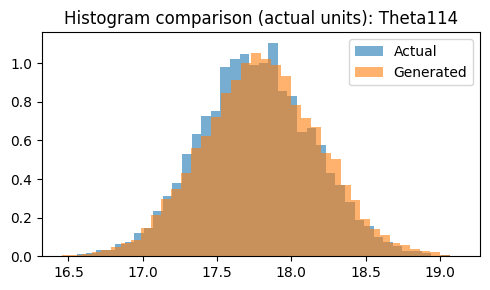

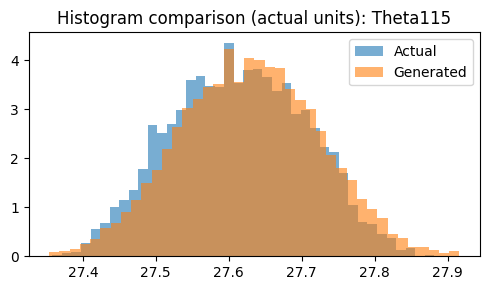

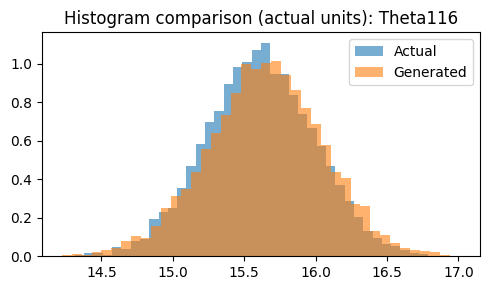

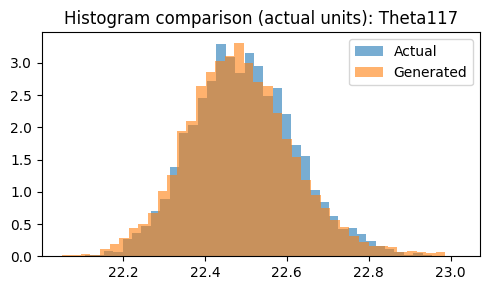

In [39]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import wasserstein_distance

BASE_MVA = 100

p_cols = [c for c in actual.columns if c.startswith("P")]
q_cols = [c for c in actual.columns if c.startswith("Q")]
v_cols = [c for c in actual.columns if c.startswith("V")]
theta_cols = [c for c in actual.columns if c.startswith("Th")]

num_buses = len(p_cols)
print(f"\nDetected {num_buses} buses based on column naming (P1...P{num_buses}).")

actual_nonpu = actual.copy()
generated_nonpu = generated.copy()

for col in p_cols:
    actual_nonpu[col] = actual[col] * BASE_MVA
    generated_nonpu[col] = generated[col] * BASE_MVA

for col in q_cols:
    actual_nonpu[col] = actual[col] * BASE_MVA
    generated_nonpu[col] = generated[col] * BASE_MVA

vn_kv = net.bus.vn_kv.values
for i, col in enumerate(v_cols):
    actual_nonpu[col] = actual[col] * vn_kv[i]
    generated_nonpu[col] = generated[col] * vn_kv[i]

print("\nConverted per-unit values to actual units (MW / Mvar / kV / degrees)")

for col in actual_nonpu.columns:
    plt.figure(figsize=(5,3))
    plt.hist(actual_nonpu[col], bins=40, alpha=0.6, density=True, label='Actual')
    plt.hist(generated_nonpu[col], bins=40, alpha=0.6, density=True, label='Generated')
    plt.title(f"Histogram comparison (actual units): {col}")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [40]:
pip install pot

Note: you may need to restart the kernel to use updated packages.


In [41]:
import ot
from scipy.spatial.distance import cdist
import numpy as np

def calculate_w1_distance_for_eta(eta):
    distances = []
    num_bus = NUM_BUS

    cols = (
        [f"P{i}" for i in range(num_bus)] +
        [f"Q{i}" for i in range(num_bus)] +
        [f"V{i}" for i in range(num_bus)] +
        [f"Theta{i}" for i in range(num_bus)]
    )

    theta_cols = [f"Theta{i}" for i in range(num_bus)]
    actual[theta_cols] = np.deg2rad(actual[theta_cols])
    generated[theta_cols] = np.deg2rad(generated[theta_cols])

    data_gt = actual[cols].values
    data_syn = generated[cols].values

    n = len(data_gt)
    m = len(data_syn)

    a = np.ones(n) / n
    b = np.ones(m) / m

    M = cdist(data_gt, data_syn, metric='euclidean')

    wasserstein_dist = ot.emd2(a, b, M)
    distances.append(wasserstein_dist)

    print(eta, "P Q V Theta W1 distance:", wasserstein_dist)

calculate_w1_distance_for_eta(0.2)

0.2 P Q V Theta W1 distance: 0.30069394189684195


/usr/local/lib/python3.11/dist-packages/ot/lp/_network_simplex.py:574: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  check_result(result_code)


In [42]:
from scipy.stats import entropy
import numpy as np
import pandas as pd

def kl_divergence_featurewise(actual_df, gen_df, bins=80, eps=1e-12):
    actual = actual_df.copy()
    gen = gen_df.copy()

    theta_cols = [c for c in actual.columns if "Theta" in c]

    if len(theta_cols) > 0:
        actual[theta_cols] = np.deg2rad(actual[theta_cols])
        gen[theta_cols] = np.deg2rad(gen[theta_cols])

    cols = actual.columns.tolist()
    data_gt = actual.values
    data_syn = gen.values

    kl_results = {}

    for i, col in enumerate(cols):
        real_vals = data_gt[:, i]
        test_vals = data_syn[:, i]
        
        hist_range = (
            min(real_vals.min(), test_vals.min()),
            max(real_vals.max(), test_vals.max())
        )

        real_hist, _ = np.histogram(real_vals, bins=bins, range=hist_range, density=True)
        test_hist, _ = np.histogram(test_vals, bins=bins, range=hist_range, density=True)

        real_hist += eps
        test_hist += eps

        real_hist /= real_hist.sum()
        test_hist /= test_hist.sum()

        kl = entropy(real_hist, test_hist)
        kl_results[col] = kl

    return pd.DataFrame(kl_results, index=["KL"]).T
    
kl = kl_divergence_featurewise(actual, generated)
print(kl)
print(kl["KL"].mean())

                KL
P0        0.038901
P1        0.147185
P2        0.129931
P3        0.133631
P4        1.249668
P5        0.132514
P6        0.126987
P7        0.142844
P8        0.691548
P9        0.034499
P10       0.130259
P11       0.167124
P12       0.128676
P13       0.146162
P14       0.089789
P15       0.126150
P16       0.132060
P17       0.154890
P18       0.021621
P19       0.152935
P20       0.135127
P21       0.127598
P22       0.139590
P23       0.136400
P24       0.026814
P25       0.049652
P26       0.137926
P27       0.125490
P28       0.118186
P29       1.299383
P30       0.136857
P31       0.141557
P32       0.133655
P33       0.140434
P34       0.128250
P35       0.130084
P36       0.858258
P37       0.754810
P38       0.130232
P39       0.016841
P40       0.138227
P41       0.035292
P42       0.128498
P43       0.139355
P44       0.137892
P45       0.208619
P46       0.142042
P47       0.126290
P48       0.121655
P49       0.120439
P50       0.111713
P51       0.